🔰**TRAFFIC ACCIDENT DATA ANALYSIS – TASK 4**

**SKILLCRAFT TECHNOLOGY**


✅ Analyzing accident patterns based on road conditions, weather, and time of day

✅ Visualizing accident hotspots & contributing factors using colorful charts and maps

### Setup and Data Loading

In [20]:
#AKASH_TASK_4
# Install folium if not available
!pip install folium --quiet

# Import all libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap

# Setup plot style
sns.set(style="whitegrid")

In [21]:
!pip install basemap --quiet
!pip install basemap-data-hires --quiet

### Download and Load Dataset

In [22]:
import kagglehub

# 📥 Download US Accidents dataset
path = kagglehub.dataset_download("sobhanmoosavi/us-accidents")

print("Dataset downloaded to:", path)

Dataset downloaded to: /kaggle/input/us-accidents


### Load and Preview Data

In [23]:
import os

# 🔍 Detect CSV file inside downloaded folder
csv_file = [f for f in os.listdir(path) if f.endswith('.csv')][0]
csv_path = os.path.join(path, csv_file)

# ✅ Load only required columns to save memory
use_cols = ['ID', 'Start_Time', 'End_Time', 'Severity', 'Weather_Condition',
            'Start_Lat', 'Start_Lng', 'Crossing', 'Junction', 'Traffic_Signal']

# 🧠 Load only first 500,000 rows if you're low on RAM (optional)
df = pd.read_csv(csv_path, usecols=use_cols, nrows=500000)

# ⏰ Convert time column
df['Start_Time'] = pd.to_datetime(df['Start_Time'])

# 👀 Preview the data
df.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Weather_Condition,Crossing,Junction,Traffic_Signal
0,A-1,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,Light Rain,False,False,False
1,A-2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,Light Rain,False,False,False
2,A-3,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,Overcast,False,False,True
3,A-4,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,Mostly Cloudy,False,False,False
4,A-5,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,Mostly Cloudy,False,False,True


### Feature Engineering: Extracting Time Features

In [24]:
# Extract features from Start_Time
df['Year'] = df['Start_Time'].dt.year
df['Hour'] = df['Start_Time'].dt.hour
df['Day'] = df['Start_Time'].dt.day_name()

### Feature Engineering: Categorizing Time of Day

In [25]:
# 🧠 Define function to categorize time into periods
def get_time_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

# 🕓 Apply it to create a new column
df['Time_of_Day'] = df['Hour'].apply(get_time_of_day)

### Visualization: Accidents by Time of Day

/tmp/ipython-input-26-1297616964.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Time_of_Day', order=['Morning', 'Afternoon', 'Evening', 'Night'], palette='YlOrRd')


Accident counts by Time of Day:
Time_of_Day
Morning      202260
Afternoon    131526
Evening      112752
Night         53462
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128338 (\N{CLOCK FACE THREE OCLOCK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


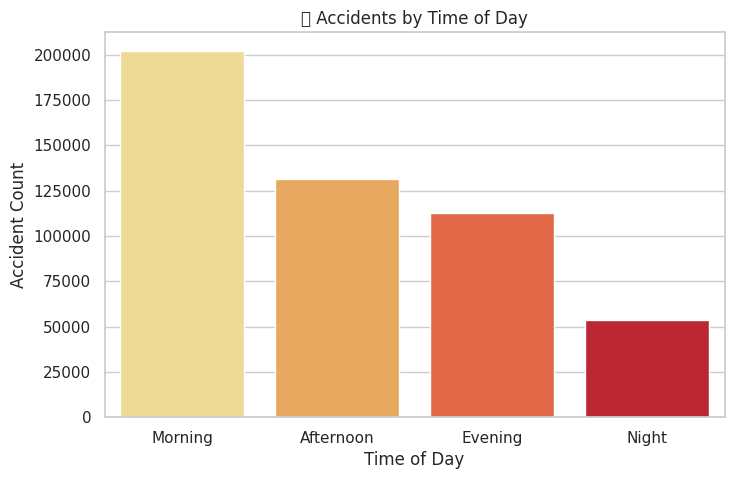

In [26]:
# 📊 Countplot
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='Time_of_Day', order=['Morning', 'Afternoon', 'Evening', 'Night'], palette='YlOrRd')
plt.title("🕒 Accidents by Time of Day")
plt.xlabel("Time of Day")
plt.ylabel("Accident Count")

# Add text output
time_of_day_counts = df['Time_of_Day'].value_counts().reindex(['Morning', 'Afternoon', 'Evening', 'Night'])
print("Accident counts by Time of Day:")
print(time_of_day_counts)

plt.show()

### Visualization: Accidents Per Year

/tmp/ipython-input-27-3226134633.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Year', palette='viridis')


Accident counts per Year:
Year
2016    281261
2017    218739
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


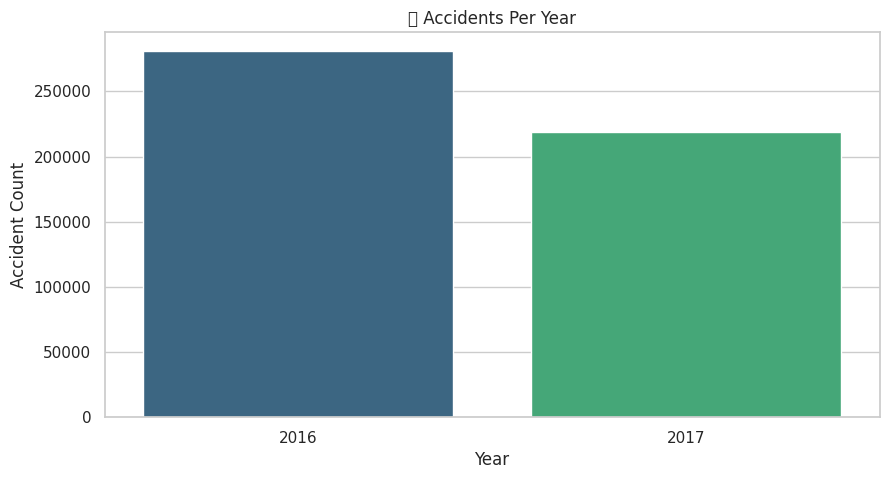

In [27]:
plt.figure(figsize=(10,5))
sns.countplot(data=df, x='Year', palette='viridis')
plt.title("📅 Accidents Per Year")
plt.xlabel("Year")
plt.ylabel("Accident Count")

# Add text output
year_counts = df['Year'].value_counts().sort_index()
print("Accident counts per Year:")
print(year_counts)

plt.show()

### Visualization: Accidents by Hour of Day

/tmp/ipython-input-28-3844739340.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Hour', palette='coolwarm')


Accident counts by Hour of Day:
Hour
0      4892
1      3722
2      3924
3      3202
4      6426
5      9897
6     18818
7     33490
8     40174
9     34459
10    32781
11    32641
12    26779
13    24211
14    25890
15    24471
16    30175
17    33180
18    30126
19    26113
20    23333
21    14876
22    11366
23     5054
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128338 (\N{CLOCK FACE THREE OCLOCK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


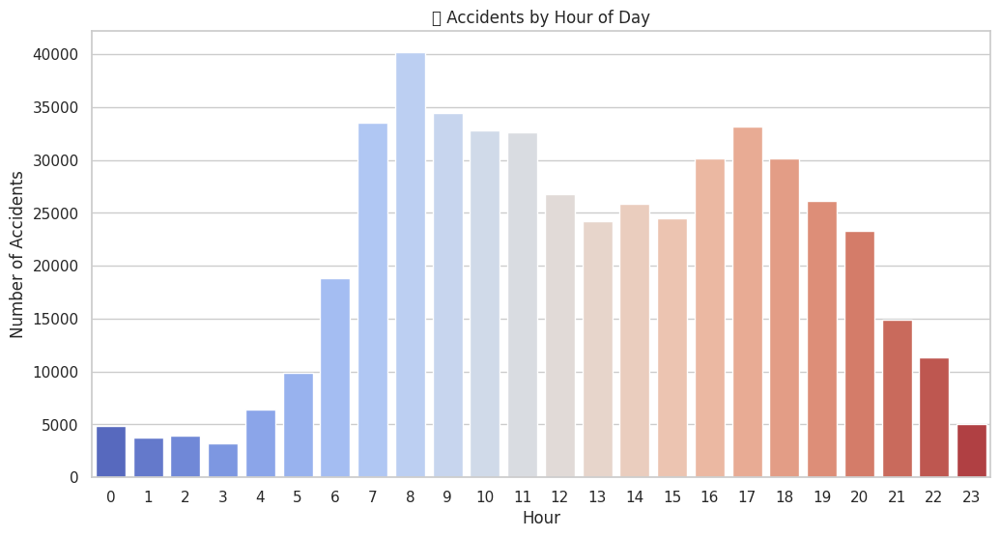

In [28]:
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='Hour', palette='coolwarm')
plt.title("🕒 Accidents by Hour of Day")
plt.xlabel("Hour")
plt.ylabel("Number of Accidents")

# Add text output
hour_counts = df['Hour'].value_counts().sort_index()
print("Accident counts by Hour of Day:")
print(hour_counts)

plt.show()

### Visualization: Accidents by Day of Week

/tmp/ipython-input-29-3714340860.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Day', order=day_order, palette='flare')


Accident counts by Day of Week:
Day
Monday       83912
Tuesday      89716
Wednesday    89338
Thursday     90234
Friday       87345
Saturday     31529
Sunday       27926
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128467 (\N{SPIRAL CALENDAR PAD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


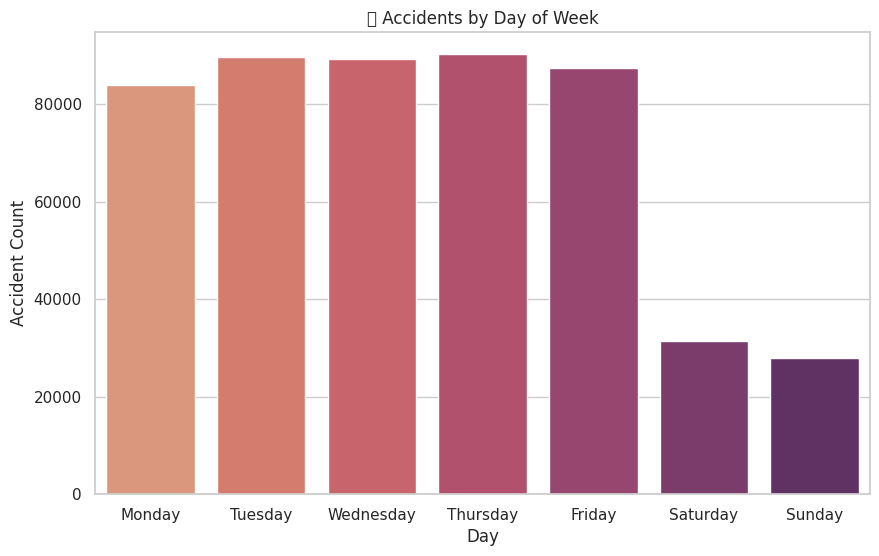

In [29]:
plt.figure(figsize=(10,6))
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(data=df, x='Day', order=day_order, palette='flare')
plt.title("🗓️ Accidents by Day of Week")
plt.xlabel("Day")
plt.ylabel("Accident Count")

# Add text output
day_counts = df['Day'].value_counts().reindex(day_order)
print("Accident counts by Day of Week:")
print(day_counts)

plt.show()

### Visualization: Top 10 Weather Conditions

Accident counts for top 10 weather conditions:
Weather_Condition
Clear               205029
Overcast             79031
Mostly Cloudy        66165
Partly Cloudy        46908
Scattered Clouds     45714
Light Rain           20500
Haze                  5884
Rain                  4248
Light Snow            3962
Fair                  2456
Name: count, dtype: int64


/tmp/ipython-input-30-368940509.py:10: UserWarning: Glyph 127782 (\N{WHITE SUN BEHIND CLOUD WITH RAIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127782 (\N{WHITE SUN BEHIND CLOUD WITH RAIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


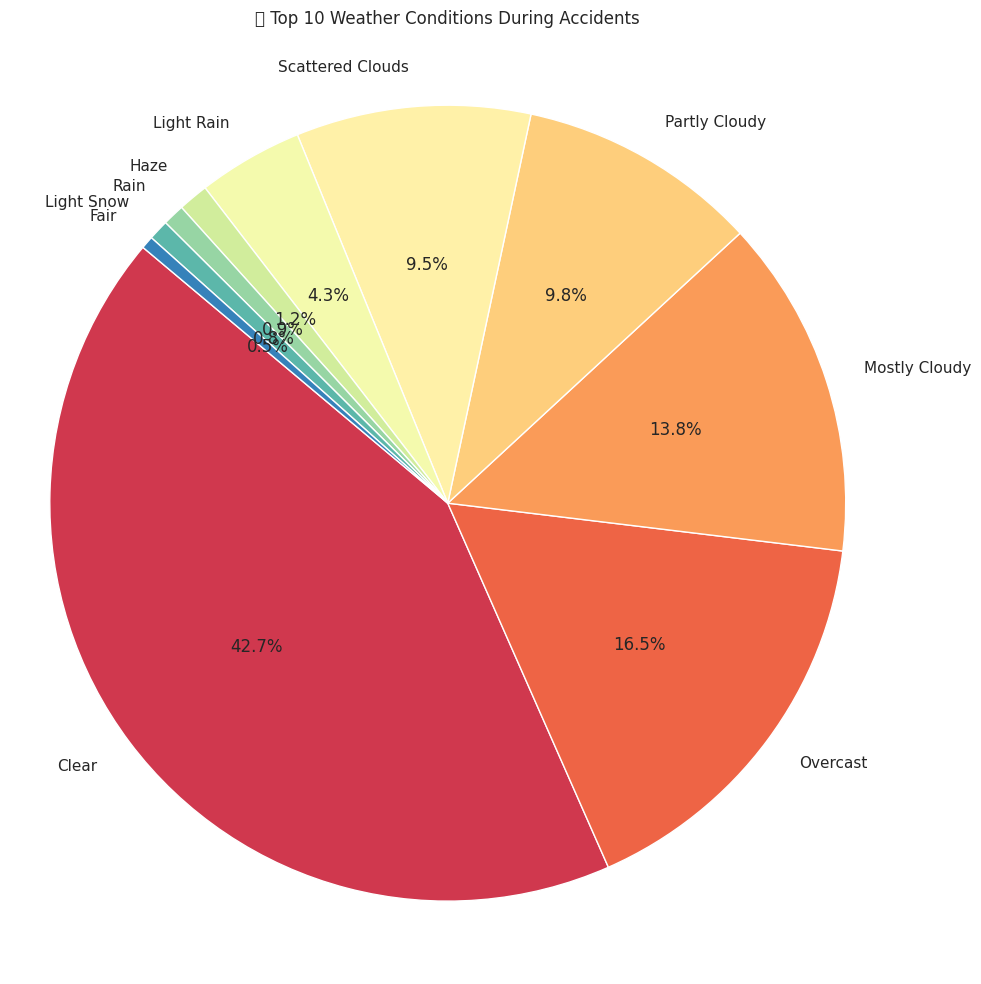

In [30]:
top_weather = df['Weather_Condition'].value_counts().head(10)

print("Accident counts for top 10 weather conditions:")
print(top_weather)

plt.figure(figsize=(10, 10)) # Adjusted figure size for pie chart
plt.pie(top_weather.values, labels=top_weather.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Spectral', len(top_weather))) # Changed to pie chart
plt.title("🌦️ Top 10 Weather Conditions During Accidents")
plt.axis('equal') # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()

### Visualization: Road Features Involved in Accidents

Accident counts by Road Feature:
Crossing           70135
Junction           31923
Traffic_Signal    114917
dtype: int64


/tmp/ipython-input-31-3371531996.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=infra_counts.index, y=infra_counts.values, palette='Set2')
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127959 (\N{BUILDING CONSTRUCTION}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


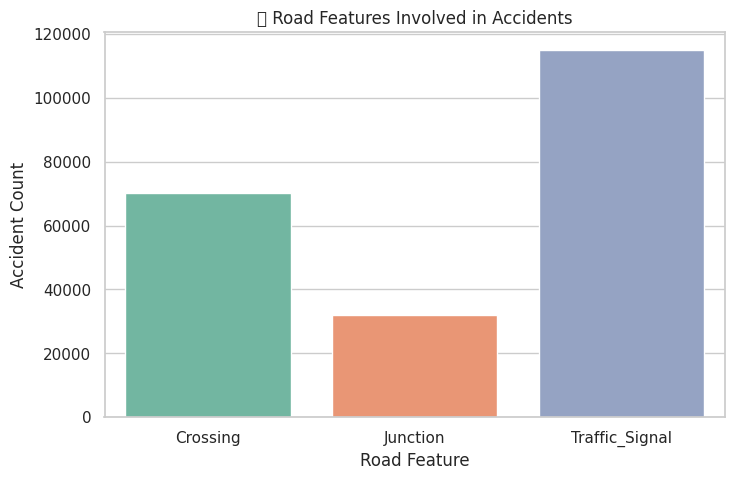

In [31]:
infra_cols = ['Crossing', 'Junction', 'Traffic_Signal']
infra_counts = df[infra_cols].sum()

print("Accident counts by Road Feature:") # Added text output
print(infra_counts) # Added text output

plt.figure(figsize=(8,5))
sns.barplot(x=infra_counts.index, y=infra_counts.values, palette='Set2')
plt.title("🏗️ Road Features Involved in Accidents")
plt.xlabel("Road Feature")
plt.ylabel("Accident Count")
plt.show()

### Heatmap Data Preparation

In [32]:
sample_df = df[['Start_Lat', 'Start_Lng']].dropna().sample(n=10000, random_state=42)

### Visualization: Accident Hotspots Heatmap (Basemap)

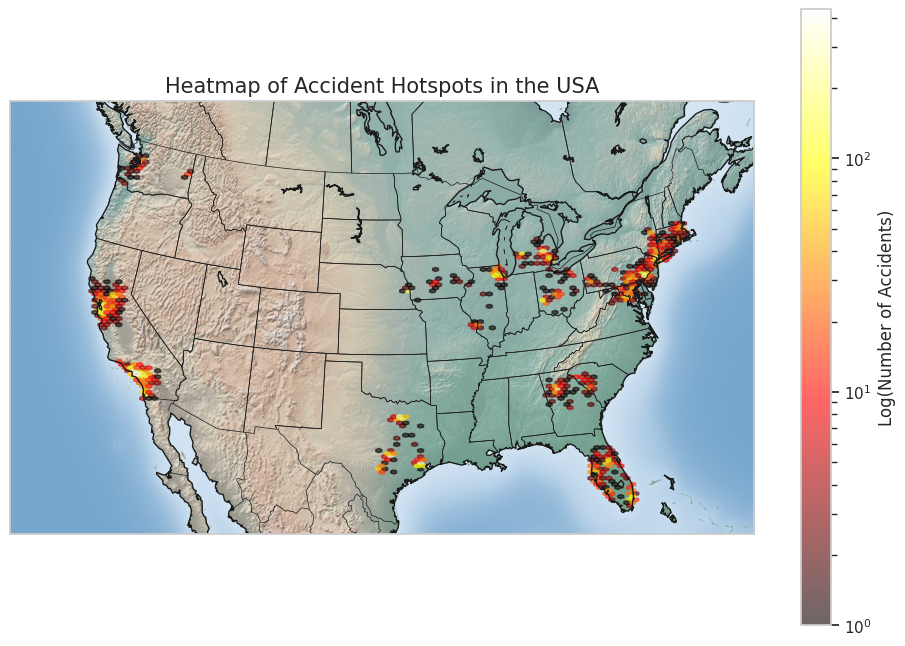

In [33]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Central USA view
m = Basemap(projection='lcc',
            resolution='l',
            lat_0=39.5, lon_0=-98.35,
            width=5.5E6, height=3.2E6)

m.shadedrelief()
m.drawcoastlines()
m.drawcountries()
m.drawstates()

# Convert lat/lng to projection coordinates
x, y = m(sample_df['Start_Lng'].values, sample_df['Start_Lat'].values)

# Create heatmap with hexbin
hb = plt.hexbin(x, y, gridsize=100, bins='log', cmap='hot', alpha=0.6)

plt.colorbar(hb, label='Log(Number of Accidents)')
plt.title("Heatmap of Accident Hotspots in the USA", fontsize=15)
plt.show()

### Coordinate Transformation

In [34]:
# Install basemap if not available
!pip install basemap basemap-data-hires --quiet

In [35]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import kagglehub

# 📥 Download US Accidents dataset
# This code was moved here to ensure 'path' is defined
try:
    path = kagglehub.dataset_download("sobhanmoosavi/us-accidents")
    print("Dataset downloaded to:", path)
except Exception as e:
    print(f"Error downloading dataset: {e}")
    raise # Re-raise the exception if download fails


# 🔍 Detect CSV file inside downloaded folder
try:
    csv_file = [f for f in os.listdir(path) if f.endswith('.csv')][0]
    csv_path = os.path.join(path, csv_file)
except NameError:
    print("Error: 'path' variable is not defined after download.")
    raise # Re-raise the error if path is still not defined


# ✅ Load only required columns to save memory
use_cols = ['ID', 'Start_Time', 'End_Time', 'Severity', 'Weather_Condition',
            'Start_Lat', 'Start_Lng', 'Crossing', 'Junction', 'Traffic_Signal']

# 🧠 Load only first 500,000 rows if you're low on RAM (optional)
df = pd.read_csv(csv_path, usecols=use_cols, nrows=500000)

# ⏰ Convert time column
df['Start_Time'] = pd.to_datetime(df['Start_Time'])


# Prepare data for heatmap - sample 10000 points
sample_df = df[['Start_Lat', 'Start_Lng']].dropna().sample(n=10000, random_state=42)


# Initialize the Basemap object
# Central USA view
m = Basemap(projection='lcc',
            resolution='l',
            lat_0=39.5, lon_0=-98.35,
            width=5.5E6, height=3.2E6)


# Convert lat/lng to projection coordinates
x, y = m(sample_df['Start_Lng'].values, sample_df['Start_Lat'].values)
print("Coordinate transformation successful.")

Dataset downloaded to: /kaggle/input/us-accidents
Coordinate transformation successful.


### Identify Top Hotspots

In [36]:
import numpy as np

# Define bins
gridsize = 100
xmin, xmax = min(x), max(x)
ymin, ymax = min(y), max(y)

xedges = np.linspace(xmin, xmax, gridsize)
yedges = np.linspace(ymin, ymax, gridsize)

# Create 2D histogram
heatmap, xedges, yedges = np.histogram2d(x, y, bins=[xedges, yedges])



import pandas as pd

# Flatten to tabular format
heatmap_df = pd.DataFrame({
    'x_bin': np.repeat(range(heatmap.shape[0]), heatmap.shape[1]),
    'y_bin': list(range(heatmap.shape[1])) * heatmap.shape[0],
    'count': heatmap.flatten()
})

# Filter non-zero cells (hotspots)
hotspots = heatmap_df[heatmap_df['count'] > 0]



top_hotspots = hotspots.sort_values(by='count', ascending=False).head(10)
print(top_hotspots)

      x_bin  y_bin  count
730       7     37  568.0
5357     54     11  359.0
9074     91     65  268.0
5073     51     24  234.0
4865     49     14  227.0
155       1     56  212.0
729       7     36  198.0
356       3     59  187.0
731       7     38  178.0
9276     93     69  174.0


### Hotspot Analysis

In [37]:
print("Total accident cells:", len(hotspots))
print("Average accidents per active cell:", hotspots['count'].mean())
print("Max accidents in one cell:", hotspots['count'].max())
print("Std deviation:", hotspots['count'].std())

Total accident cells: 484
Average accidents per active cell: 20.66115702479339
Max accidents in one cell: 568.0
Std deviation: 48.04428662960402


### Convert Hotspot Coordinates to Lat/Lng

In [38]:
# Convert x_bin, y_bin to approximate map coordinates
x_center = (xedges[top_hotspots['x_bin']] + xedges[top_hotspots['x_bin'] + 1]) / 2
y_center = (yedges[top_hotspots['y_bin']] + yedges[top_hotspots['y_bin'] + 1]) / 2

# Convert back to Lat/Lng using Basemap inverse transformation
lon, lat = m(x_center, y_center, inverse=True)

# Add to DataFrame
top_hotspots['Latitude'] = lat
top_hotspots['Longitude'] = lon

### Visualization: Accident Hotspots Heatmap (Folium)

In [39]:
import folium
from folium.plugins import HeatMap

# 🌍 Use 100,000 points — adjust up to 500,000 if RAM allows
map_df = df[['Start_Lat', 'Start_Lng']].dropna().sample(500000)

# 🗺️ Create base map with better tile design
base_map = folium.Map(
    location=[map_df['Start_Lat'].mean(), map_df['Start_Lng'].mean()],
    zoom_start=5,
    tiles='Stamen Toner',  # Darker theme for glowing contrast
    attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.' # Added attribution
)

# 🔥 Add HeatMap layer
HeatMap(
    map_df.values,
    radius=5, # Reduced radius
    blur=10, # Reduced blur
    max_zoom=10,
    gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 0.8: 'red'}
).add_to(base_map)

# 💥 Display final map
base_map